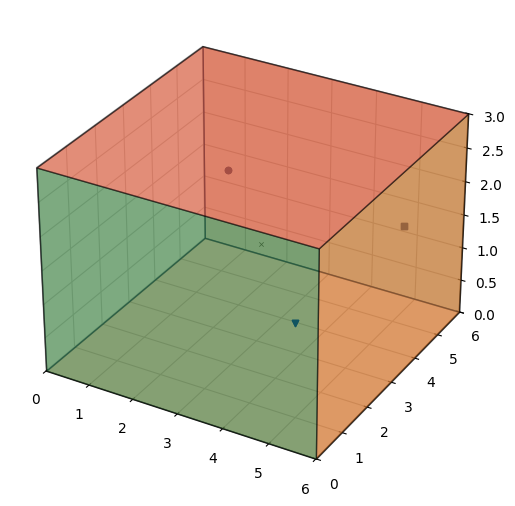

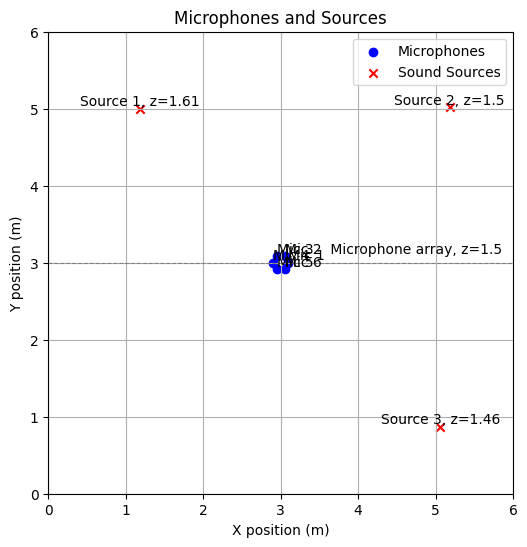

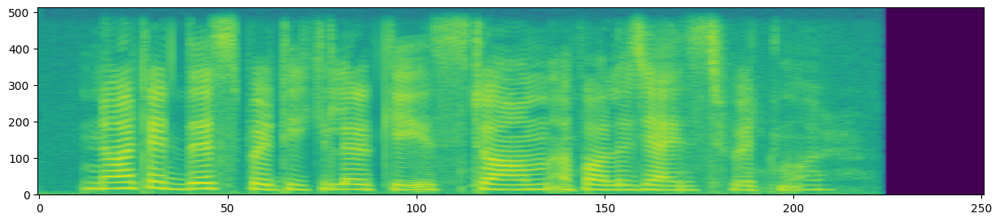

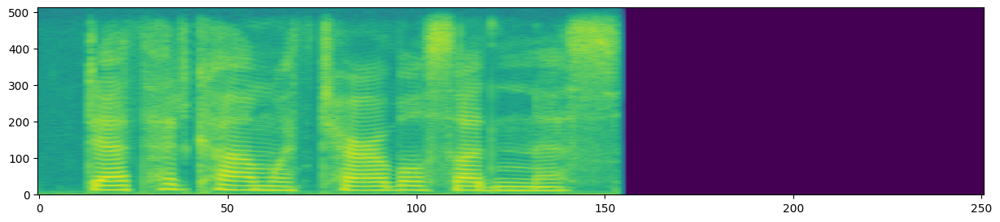

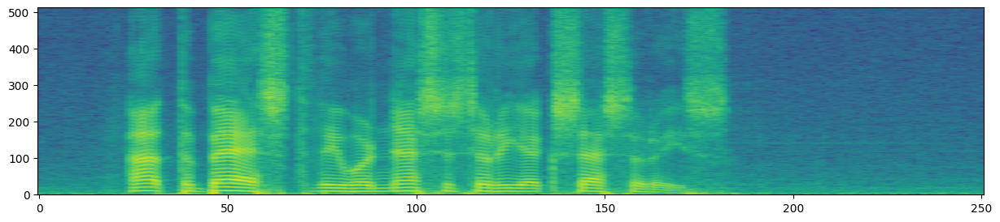

...

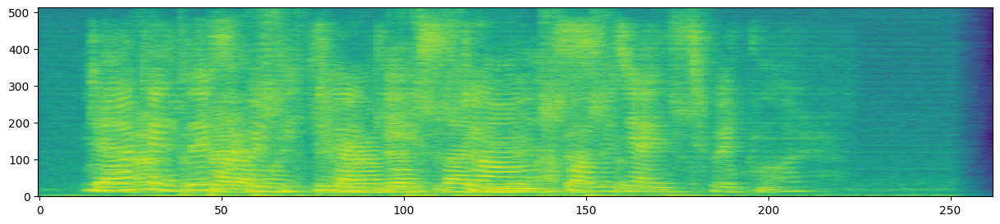

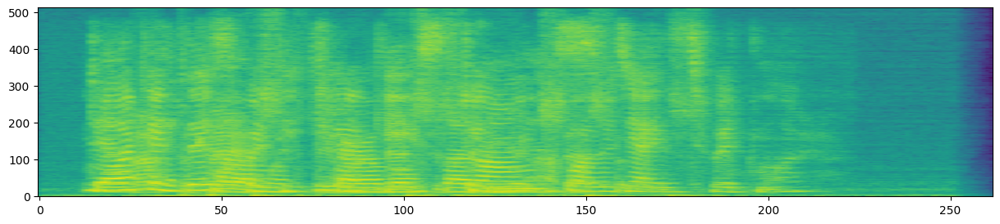

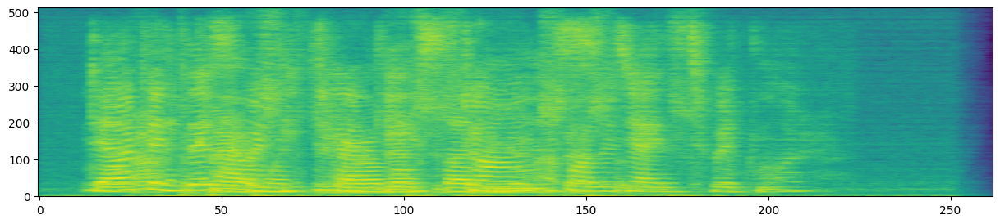

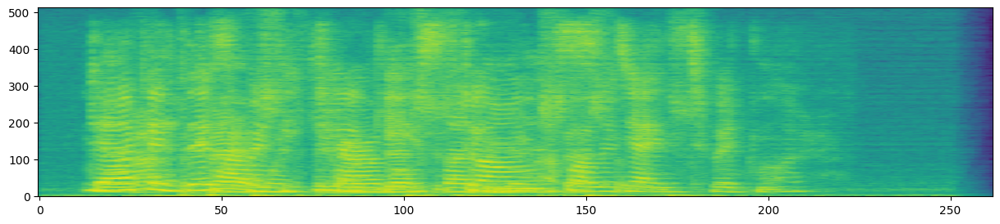

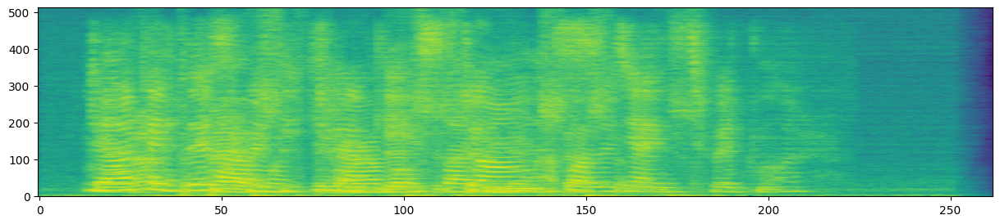

In [ ]:
# import numpy as np
# import soundfile as sf
# import librosa
# import pickle as pic
# import scipy.signal
# import matplotlib.pyplot as plt
# import IPython.display as ipd
# import pyroomacoustics as pra
# from scipy.io import wavfile

# # パラメータ設定
# SOUND_SPEED = 340 # 音速
# SAMPLING_RATE = 16000 # サンプリング周波数
# N_FFT = 1024 # STFTの窓幅
# HOP_LENGTH = 256 # STFTのシフト幅
# F = int(N_FFT/2 + 1) # 周波数ビン数
# MAX_REFRECTION_ORDER = 10 # 反射の最大回数

# absorption = 0.6 # 吸音率

# # 部屋の設定
# room = pra.ShoeBox(
#     [6,6,3], # Shoebox型で指定(縦*横*高)
#     materials = pra.Material(absorption),
#     fs = SAMPLING_RATE,
#     t0 = 0.0,
#     max_order = MAX_REFRECTION_ORDER,
#     sigma2_awgn = None,
#     sources = None,
#     mics = None
# )

# # マイク設定
# center = np.array([3,3,1.5]) #? 部屋の中心を指定. z座標は耳の高さ
# M = 6 # マイク数
# radius = 0.1 # 半径

# # マイクの配置を自分で指定
# angles = np.linspace(0, 2 * np.pi, M, endpoint=False)
# mic_locs = np.array([
#     [center[0] + radius * np.cos(angle),
#      center[1] + radius * np.sin(angle),
#      center[2]]
#     for angle in angles
# ]).T
# #* room.add_microphoneは(3, M)の形のみ有効. 
# #* 転置して(3, M)に

# # マイクを配置
# for i in range(M):
#     room.add_microphone(mic_locs[:, i].reshape(3,1))

# #? 複数音源のファイルと配置する位置を指定
# # 音源位置
# source_locs = np.array([
#     [1.18, 5.0, 1.61],
#     [5.18, 5.02, 1.5],
#     [5.06, 0.87, 1.46]
# ])
# # 音声ファイル
# files = ["data/arctic_a0002.wav",
#          "data/arctic_a0086.wav",
#          "data/arctic_b0540.wav"]

# # 音源を配置
# for position, file in zip(source_locs, files):
#     fs, signal = wavfile.read(file)
#     room.add_source(position, signal = signal)

# #! 部屋の形状の可視化
# fig, ax = room.plot()
# ax.set_ylim([0,6])
# ax.set_xlim([0,6])
# ax.set_zlim([0,3])

# #! 2D plot
# plt.figure(figsize=(6, 6))  # 図のサイズを指定
# plt.title("Microphones and Sources")
# plt.xlabel("X position (m)")
# plt.ylabel("Y position (m)")
# plt.xlim(0, 6)
# plt.ylim(0, 6)

# # マイクの位置をプロット
# plt.scatter(mic_locs[0], mic_locs[1], label='Microphones', color='blue', marker='o')
# # 音源の位置をプロット
# plt.scatter(source_locs[:, 0], source_locs[:, 1], label='Sound Sources', color='red', marker='x')
# # ラベルの追加
# for i, pos in enumerate(source_locs):
#     plt.text(pos[0], pos[1], f'Source {i + 1}, z={source_locs[i,2]}', fontsize=10, verticalalignment='bottom', horizontalalignment='center')
# for i, pos in enumerate(mic_locs.T):
#     if i == 1:
#         plt.text(pos[0], pos[1], f'Mic {i + 1}  Microphone array, z=1.5', fontsize=10, verticalalignment='bottom')
#     else:
#         plt.text(pos[0], pos[1], f'Mic {i + 1}', fontsize=10, verticalalignment='bottom')

# plt.axhline(y=center[1], color='gray', linestyle='--', linewidth=0.8)  # 中心線を描画
# plt.grid()  # グリッドを表示
# plt.legend()  # 凡例を表示

# plt.show()

# N = len(files)


# # 生成した音声の可視化・確認
# def visualize_spec(Z_FTN):
#     for n in range(Z_FTN.shape[2]):
#         signal = librosa.core.istft(Z_FTN[:, :, n], hop_length=int((F-1)/2))
#         plt.rcParams['figure.figsize'] = (15.0, 3.0)
#         plt.imshow(np.log(np.abs(Z_FTN[:, :, n]) +
#                           1.0e-8), origin='lower', aspect="auto")
#         plt.show()
#         ipd.display(ipd.Audio(signal, rate=SAMPLING_RATE))

# def visualize_wav(wav_MT):
#     M, T = wav_MT.shape

#     for m in range(M):
#         spec = librosa.core.stft(
#             wav_MT[m], n_fft=N_FFT, hop_length=int(N_FFT/4))
#         plt.rcParams['figure.figsize'] = (15.0, 3.0)
#         plt.imshow(np.log(np.abs(spec) + 1.0e-8),
#                    origin='lower', aspect="auto")
#         plt.show()
#         ipd.display(ipd.Audio(wav_MT[m], rate=SAMPLING_RATE))

# wav_list = []

# for filename in files:
#     wav, fs = sf.read(filename)
#     wav_list.append(wav)

# max_length = max(map(len, wav_list))
# wav_NT = np.zeros([N, max_length])  # 長さを揃えた N x Lengthの信号

# for n in range(N):
#     wav_NT[n, :len(wav_list[n])] = wav_list[n]

# visualize_wav(wav_NT) # それぞれの音源の音声

# def convolve_RIR(signal_NT):
#     convolved_signals = []
#         # 指定した条件での音源からマイクまでの音の伝達をシミュレート
#     room.simulate()
#     mixture_signal_MT = room.mic_array.signals
#     mixture_signal_MT /= np.abs(mixture_signal_MT).max() * 1.2
    
#     return mixture_signal_MT

# mixture_signal_MT = convolve_RIR(wav_NT)
# sf.write("data/mixture_time_domain.wav", mixture_signal_MT.T, 16000)

# visualize_wav(mixture_signal_MT) # マイクで録音した混合音

In [ ]:
# # test
# import sounddevice as sd
# import numpy as np

# # 1秒間のサイン波を再生
# fs = 44100  # サンプリング周波数
# duration = 1.0  # 秒
# frequency = 440.0  # Hz (A4の周波数)

# t = np.linspace(0, duration, int(fs * duration), endpoint=False)
# signal = 0.5 * np.sin(2 * np.pi * frequency * t)

# sd.play(signal, samplerate=fs)
# sd.wait()


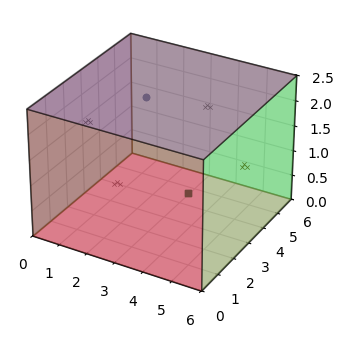

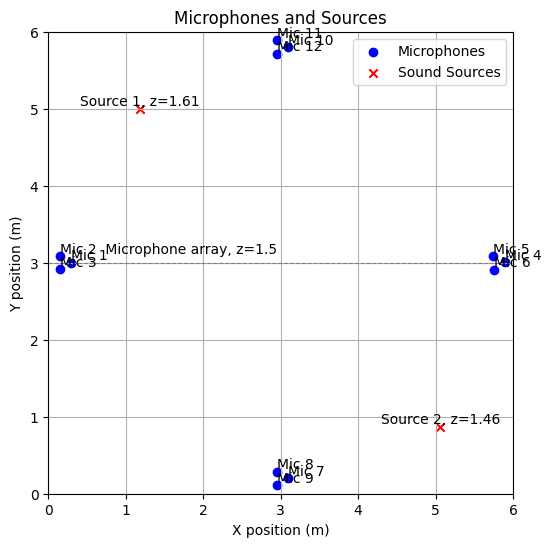

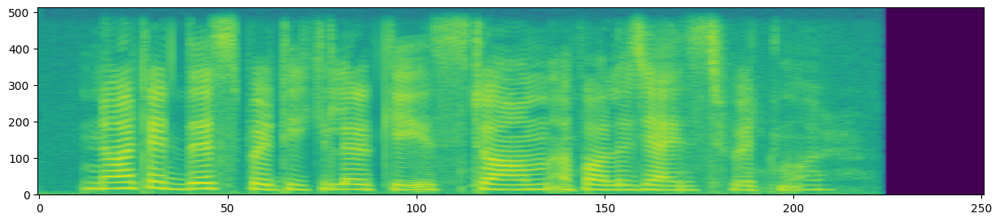

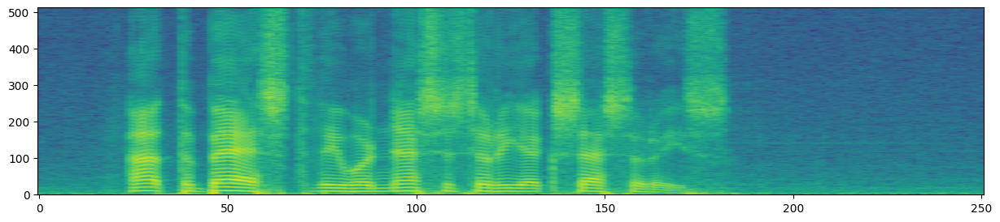

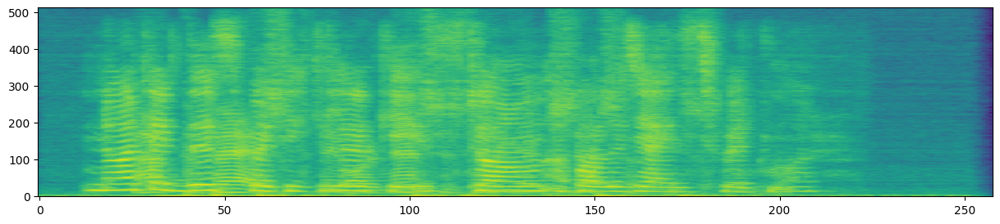

...

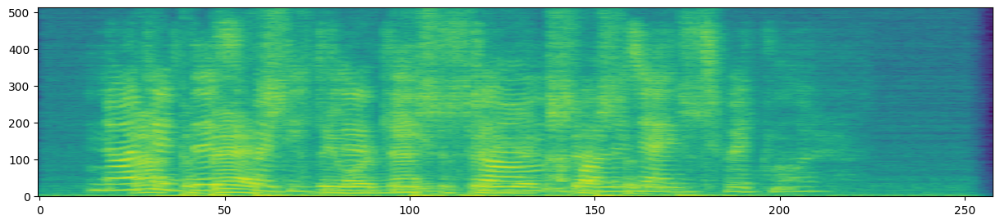

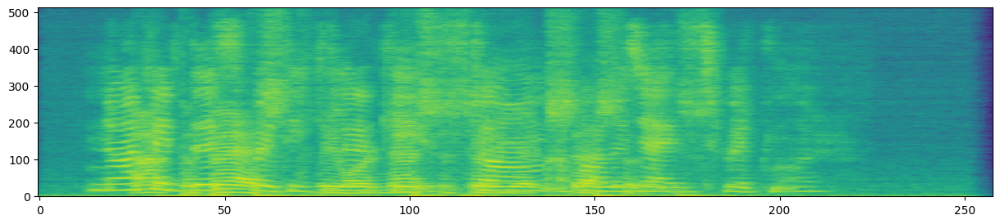

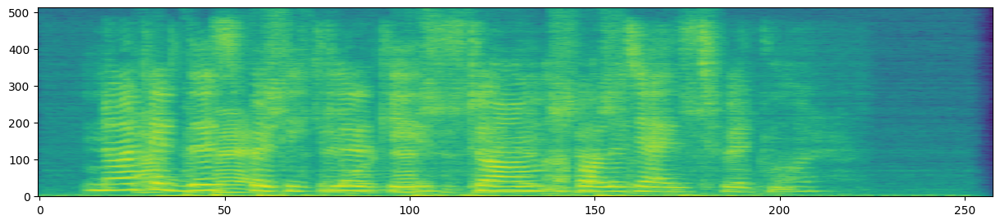

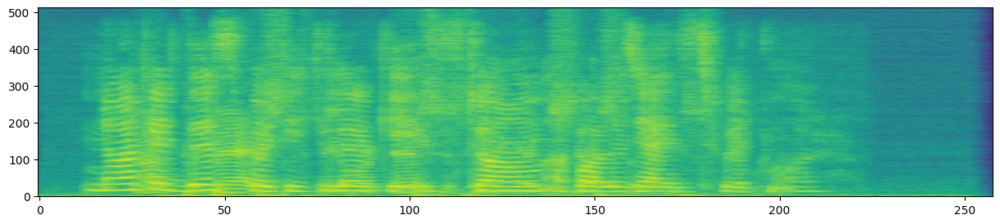

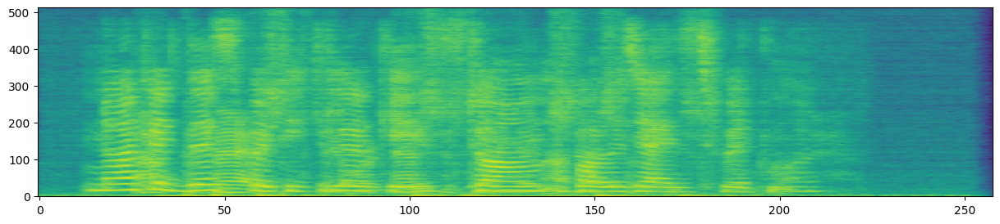

In [2]:
# 2音源・マイクを四方の壁の中心でやってみる

import numpy as np
import torch
import soundfile as sf
import librosa
import pickle as pic
import scipy.signal
import matplotlib.pyplot as plt
import IPython.display as ipd
import pyroomacoustics as pra
from scipy.io import wavfile

SOUND_SPEED = 340.
SAMPLING_RATE = 16000  # 保存するときのサンプリングレート
N_FFT = 1024  # 窓幅
HOP_LENGTH = 256  # シフト幅（オーバラップをどれだけにするか）
F = int(N_FFT/2+1)  # 周波数ビン数

# 部屋のパラメータ
absorption = 0.6  # 吸音率
MAX_REFLECTION_ORDER = 6    # 反射の最大回数
corners = np.array([[0, 0], [0, 6], [6, 6], [6 , 0]]).T  # [x, y] (meter)
room = pra.Room.from_corners(corners, materials=pra.Material(absorption), fs=SAMPLING_RATE, t0=0.0, max_order=MAX_REFLECTION_ORDER)
room.extrude(2.5)  # 部屋の高さ
center_x = (0 + 6) / 2  # x座標の中心
center_y = (0 + 6) / 2  # y座標の中心
# マイクアレイのパラメータ
n_mics_per_array = 3  # 各マイクアレイのチャンネル数
radius = 0.1          # マイクアレイの半径（メートル）
center_z = 1.5        # マイクの高さ（人の耳の高さ）

# マイクアレイの幾何学 (2D座標系での半径方向の配置)
angles = np.linspace(0, 2 * np.pi, n_mics_per_array, endpoint=False)  # 各マイクの角度
mic_array_geometry = np.array([  # 形状: (2, n_mics_per_array)
    radius * np.cos(angles),  # x座標
    radius * np.sin(angles)   # y座標
])
# マイクアレイの中心位置と回転角度
mic_array_locs = np.array([  # 形状: (4, I)
    [0.2, 3.0, center_z, 0],       # 左壁付近 (x, y, z, θ)
    [5.8, 3.0, center_z, np.pi],   # 右壁付近 (x, y, z, θ)
    [3, 0.2, center_z, np.pi/2], # 下壁付近 (x, y, z, θ)
    [3, 5.8, center_z, -np.pi/2] # 上壁付近 (x, y, z, θ)
]).T  # 転置して形状を (4, I) に変更

class array_centers():  #! マイクアレイ中心を自分で指定
    def set_array_centers(self):
        self.array_locs = np.array([
        [0.2, 3.0],     # 左の壁の中央付近
        [5.8, 3.0],     # 右の壁の中央付近
        [3, 0.2],     # 下の壁の中央付近
        [3, 5.8]      # 上の壁の中央付近
        ])

        self.gpu_array_locs = torch.tensor([
        [0.2, 3.0],  # 左の壁の中央付近
        [5.8, 3.0],  # 右の壁の中央付近
        [3, 0.2],  # 下の壁の中央付近
        [3, 5.8]   # 上の壁の中央付近
        ], dtype=torch.float32)  # dtypeは必要に応じてfloat64に変更可能
        
def rotate_coordinates(xy, deg: int) -> np.ndarray:
    '''回転行列を作用
    Args:
    xy: tensor, (2, M)
    '''
    theta = np.radians(deg)
    R = np.array([
        [np.cos(theta), -np.sin(theta)],
        [np.sin(theta),  np.cos(theta)]
    ])
    return np.dot(R, xy)

def get_whole_3D_mic_locs(mic_array_locs, mic_array_geometry) -> np.ndarray:
    '''
    Args:
    mic_array_locs: list,(4,I), 各マイクアレイの中心座標・回転角
    mic_array_geometry: list,(2,MI), アレイ内のマイク配置
    
    Returns:
    mic_locs: mic_locs: list,(3,M), マイク座標
    '''
    mic_locs = np.empty((3, 0))
    for mic_array_loc in mic_array_locs.T:
        mic_array = np.zeros((3, mic_array_geometry.shape[1])) # (3, Mi)
        mic_array[0:2, :] = rotate_coordinates(mic_array_geometry, mic_array_loc[3]) + mic_array_loc[0:2, None]
        mic_array[2, :] = mic_array_loc[2] # z
        mic_locs = np.append(mic_locs, mic_array, axis=1)
    return mic_locs # (3, M)

# 全マイク位置を計算
MIC_POSITIONS = get_whole_3D_mic_locs(mic_array_locs, mic_array_geometry)  # 形状: (3, M)
# マイクアレイを部屋に追加
mic_array = pra.MicrophoneArray(MIC_POSITIONS, room.fs)
room.add_microphone_array(mic_array)

# room.plot()

# 音源設定
SOUND_POSITIONS = np.array([
    [1.18, 5.0, 1.61],
    [5.06, 0.87, 1.46]    
])

# 音声ファイル
files = ["data/arctic_a0002.wav",
         "data/arctic_b0540.wav",]

# 音源を配置
for position, file in zip(SOUND_POSITIONS, files):
    fs, signal = wavfile.read(file)
    signal_normalized = signal / np.max(np.abs(signal)) # 正規化の前処理を追加
    room.add_source(position, signal = signal)

#! 部屋の形状の可視化
fig, ax = room.plot()
ax.set_ylim([0,6])
ax.set_xlim([0,6])
ax.set_zlim([0,2.5])

#! 2D plot
plt.figure(figsize=(6, 6))  # 図のサイズを指定
plt.title("Microphones and Sources")
plt.xlabel("X position (m)")
plt.ylabel("Y position (m)")
plt.xlim(0, 6)
plt.ylim(0, 6)

# マイクの位置をプロット
plt.scatter(MIC_POSITIONS[0],MIC_POSITIONS[1], label='Microphones', color='blue', marker='o')
# 音源の位置をプロット
plt.scatter(SOUND_POSITIONS[:, 0], SOUND_POSITIONS[:, 1], label='Sound Sources', color='red', marker='x')
# ラベルの追加
for i, pos in enumerate(SOUND_POSITIONS):
    plt.text(pos[0], pos[1], f'Source {i + 1}, z={SOUND_POSITIONS[i,2]}', fontsize=10, verticalalignment='bottom', horizontalalignment='center')
for i, pos in enumerate(MIC_POSITIONS.T):
    if i == 1:
        plt.text(pos[0], pos[1], f'Mic {i + 1}  Microphone array, z=1.5', fontsize=10, verticalalignment='bottom')
    else:
        plt.text(pos[0], pos[1], f'Mic {i + 1}', fontsize=10, verticalalignment='bottom')

plt.axhline(y=center_y, color='gray', linestyle='--', linewidth=0.8)  # 中心線を描画
plt.grid()  # グリッドを表示
plt.legend()  # 凡例を表示

plt.show()  # 2Dプロット

N = len(files)
# 生成した音声の可視化・確認
def visualize_spec(Z_FTN):
    for n in range(Z_FTN.shape[2]):
        signal = librosa.core.istft(Z_FTN[:, :, n], hop_length=int((F-1)/2))
        plt.rcParams['figure.figsize'] = (15.0, 3.0)
        plt.imshow(np.log(np.abs(Z_FTN[:, :, n]) +
                          1.0e-8), origin='lower', aspect="auto")
        plt.show()
        ipd.display(ipd.Audio(signal, rate=SAMPLING_RATE))

def visualize_wav(wav_MT):
    M, T = wav_MT.shape

    for m in range(M):
        spec = librosa.core.stft(
            wav_MT[m], n_fft=N_FFT, hop_length=int(N_FFT/4))
        plt.rcParams['figure.figsize'] = (15.0, 3.0)
        plt.imshow(np.log(np.abs(spec) + 1.0e-8),
                   origin='lower', aspect="auto")
        plt.show()
        ipd.display(ipd.Audio(wav_MT[m], rate=SAMPLING_RATE))

# 入力信号（正解データ）
wav_list = []
for filename in files:
    wav, fs = sf.read(filename)
    wav_list.append(wav)
max_length = max(map(len, wav_list))
wav_NT = np.zeros([N, max_length])  # 長さを揃えた N x Lengthの信号
for n in range(N):
    wav_NT[n, :len(wav_list[n])] = wav_list[n]
visualize_wav(wav_NT)

def convolve_RIR(signal_NT):
    convolved_signals = []
        # 指定した条件での音源からマイクまでの音の伝達をシミュレート
    room.simulate()
    mixture_signal_MT = room.mic_array.signals
    mixture_signal_MT /= np.abs(mixture_signal_MT).max() * 1.2
    return mixture_signal_MT

mixture_signal_MT = convolve_RIR(wav_NT)
sf.write("/home/yoshiilab1/soturon/mnmf/code/self_data/mixture_time_domain_2.wav", mixture_signal_MT.T, 16000)
# 混合音データ出力先
visualize_wav(mixture_signal_MT)